# Prediccion de Consumo de Energia en Hawaii a traves de RNN

### Que son las redes neuronales
Las redes neuronales son un tipo de modelo computacional inspirado en la estructura y funcionamiento del cerebro humano. Están compuestas por neuronas artificiales organizadas en capas interconectadas. Cada neurona artificial procesa la información de entrada, realiza cálculos y transmite la salida a otras neuronas en la red.

Dichas redes estan detalladas en los siguientes componentes claves:

1. **Neuronas (Nodos)**: Las neuronas son las unidades fundamentales de procesamiento en una red neuronal. Cada neurona recibe entradas ponderadas, realiza cálculos mediante una función de activación y produce una salida.

2. **Pesos y Sesgos**: Cada conexión entre neuronas tiene un peso asociado que representa la importancia de esa conexión. Los pesos determinan cómo se ponderan las entradas antes de ser procesadas por la neurona. Además, cada neurona tiene un sesgo (bias) que se suma a la suma ponderada de las entradas antes de aplicar la función de activación.

3. **Función de Activación**: La función de activación de una neurona determina si se activa o no en función de su entrada total. Las funciones de activación introducen no linealidades en la red, lo que permite a la red aprender y modelar relaciones complejas en los datos.

4. **Capas**: Las neuronas en una red neuronal se organizan en capas. Las redes neuronales típicamente tienen una capa de entrada, una o más capas ocultas y una capa de salida. Las capas ocultas contienen neuronas que realizan transformaciones no lineales en los datos de entrada, permitiendo a la red aprender representaciones más complejas.

5. **Conexiones**: Las neuronas en capas adyacentes están completamente conectadas entre sí. Cada conexión entre dos neuronas tiene un peso asociado que determina la fuerza y dirección de la conexión.

6. **Función de Costo (Pérdida)**: La función de costo (o pérdida) evalúa qué tan bien está haciendo la red en la tarea que se le ha asignado. El objetivo del entrenamiento de la red neuronal es minimizar esta función de costo ajustando los pesos y sesgos de la red.

Las redes neuronales se entrenan utilizando algoritmos de optimización como el descenso del gradiente estocástico (SGD) o variantes más avanzadas como Adam o RMSProp. Durante el entrenamiento, la red ajusta los pesos y sesgos en función de los errores calculados entre las predicciones de la red y las salidas deseadas conocidas del conjunto de datos de entrenamiento.

Las redes neuronales son extremadamente versátiles y pueden aplicarse a una amplia gama de problemas de aprendizaje automático, incluyendo clasificación, regresión, reconocimiento de patrones, procesamiento de lenguaje natural, visión por computadora y más.

## Librerias y limpieza de datos

In [1]:
# Librerias
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error

# Data set
df = pd.read_csv("Net_generation_for_all_sectors_monthly.csv", skiprows=4)

# Eliminacion de columnas innesesarias
columns_to_delete = ['coal thousand megawatthours', 'petroleum coke thousand megawatthours', 'natural gas thousand megawatthours',
                     'other gases thousand megawatthours', 'nuclear thousand megawatthours', 'conventional hydroelectric thousand megawatthours',
                     'biomass thousand megawatthours', 'wood and wood-derived fuels thousand megawatthours', 'hydro-electric pumped storage thousand megawatthours']

# Use the drop() method to delete the specified columns
df.drop(columns=columns_to_delete, inplace=True)

# Asegurarse de que la columna 'Month' es de tipo string
df['Month'] = df['Month'].astype(str)

# Reemplazar NaN en cero
df = df.fillna(0)

In [2]:
# Separar la columna 'Month' en 'Day' y 'Month_Name'
df[['Day', 'Month_Name']] = df['Month'].str.split('-', expand=True)

# Mapear los nombres de los meses a números
meses = {'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6, 'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12}
df['Month_Number'] = df['Month_Name'].map(meses)

# Ajustar el año
df['Year'] = 2000 + df['Day'].astype(int)

# Ajustar columna Month
df['Month'] = df['Month_Number']

# Eliminar columnas temporales
df.drop(columns=['Day', 'Month_Name', 'Month_Number'], inplace=True)

df.head()

,Month,all fuels (utility-scale) thousand megawatthours,petroleum liquids thousand megawatthours,wind thousand megawatthours,all utility-scale solar thousand megawatthours,geothermal thousand megawatthours,other biomass thousand megawatthours,other thousand megawatthours,all solar thousand megawatthours,small-scale solar photovoltaic thousand megawatthours,Year
0,2,682.28669,527.88439,60.28678,42.86455,0.00000,11.94287,6.50573,155.58539,112.72084,2024
1,1,775.41789,628.62051,37.39126,38.80856,0.00000,19.87721,14.57096,149.71612,110.90756,2024
2,12,791.88880,606.87424,54.34945,40.15599,31.44712,34.29110,14.12206,143.50801,103.35202,2023
3,11,804.22972,626.65621,54.77150,44.26176,33.30432,20.09452,16.43392,148.43548,104.17372,2023
4,10,851.68630,682.75887,30.24685,58.92642,32.65812,24.52119,15.74874,177.00872,118.08230,2023


## Procesamiento de Datos

In [3]:
# Data Preprocessing
input_data = df[['Month', 'all fuels (utility-scale) thousand megawatthours', 'petroleum liquids thousand megawatthours', 
                 'wind thousand megawatthours', 'all utility-scale solar thousand megawatthours', 
                 'geothermal thousand megawatthours', 'other biomass thousand megawatthours', 'other thousand megawatthours', 
                 'all solar thousand megawatthours', 'small-scale solar photovoltaic thousand megawatthours', 'Year']]
output_data = df[['all fuels (utility-scale) thousand megawatthours']]

# Normalize the data if needed
input_data = (input_data - input_data.mean()) / input_data.std()
output_data = (output_data - output_data.mean()) / output_data.std()

# Convert data to NumPy arrays
X = input_data.values
y = output_data.values

# Split data into training and testing sets
train_size = int(0.5 * len(X))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Define RNN Model
class SimpleRNN:
    def __init__(self, input_size, hidden_size, output_size):
        self.Wxh = np.random.randn(hidden_size, input_size)
        self.Whh = np.random.randn(hidden_size, hidden_size)
        self.Why = np.random.randn(output_size, hidden_size)
        self.h = np.zeros((hidden_size, 1))

    def forward(self, x):
        self.h = np.tanh(np.dot(self.Wxh, x) + np.dot(self.Whh, self.h))
        output = np.dot(self.Why, self.h)
        return output

# Training the Model
learning_rate = 0.001
num_epochs = 100

rnn = SimpleRNN(input_size=X.shape[1], hidden_size=64, output_size=1)

for epoch in range(num_epochs):
    for i in range(len(X_train)):
        x_i = X_train[i].reshape(-1, 1)
        y_i = y_train[i].reshape(-1, 1)

        # Forward pass
        predicted = rnn.forward(x_i)

        # Compute loss and update weights
        loss = np.square(predicted - y_i).sum()
        dloss = 2.0 * (predicted - y_i)
        dh = np.dot(rnn.Why.T, dloss)
        drnn = (1 - rnn.h * rnn.h) * dh
        rnn.Why -= learning_rate * np.dot(dloss, rnn.h.T)
        rnn.Wxh -= learning_rate * np.dot(drnn, x_i.T)
        rnn.Whh -= learning_rate * np.dot(drnn, rnn.h.T)

        print(f'Epoch {epoch+1}/{num_epochs}, Sample {i+1}/{len(X_train)}, Loss: {loss}')

# Evaluation
test_losses = []
for i in range(len(X_test)):
    x_test_i = X_test[i].reshape(-1, 1)
    y_test_i = y_test[i].reshape(-1, 1)
    predicted_test = rnn.forward(x_test_i)
    test_loss = np.square(predicted_test - y_test_i).sum()
    test_losses.append(test_loss)

average_test_loss = sum(test_losses) / len(test_losses)
print(f'Average Test Loss: {average_test_loss}')


Epoch 1/100, Sample 1/139, Loss: 94.35712091282011
Epoch 1/100, Sample 2/139, Loss: 6.418101966049893
Epoch 1/100, Sample 3/139, Loss: 65.60241206967817
Epoch 1/100, Sample 4/139, Loss: 65.19113914933125
Epoch 1/100, Sample 5/139, Loss: 1.5106636234504676
Epoch 1/100, Sample 6/139, Loss: 249.18028736176328
Epoch 1/100, Sample 7/139, Loss: 2.2206147190712007
Epoch 1/100, Sample 8/139, Loss: 11.643553450098889
Epoch 1/100, Sample 9/139, Loss: 2.4896142306972755
Epoch 1/100, Sample 10/139, Loss: 0.002290204084121597
Epoch 1/100, Sample 11/139, Loss: 0.02769017372399196
Epoch 1/100, Sample 12/139, Loss: 12.019866555467352
Epoch 1/100, Sample 13/139, Loss: 34.68954308269667
Epoch 1/100, Sample 14/139, Loss: 24.32134017448099
Epoch 1/100, Sample 15/139, Loss: 78.16631772982045
Epoch 1/100, Sample 16/139, Loss: 228.66874183954351
Epoch 1/100, Sample 17/139, Loss: 11.749906878280576
Epoch 1/100, Sample 18/139, Loss: 0.33175871061194206
Epoch 1/100, Sample 19/139, Loss: 1.8552624897136687
Epoch

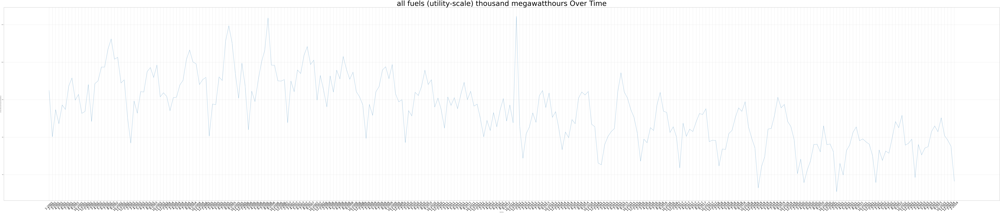

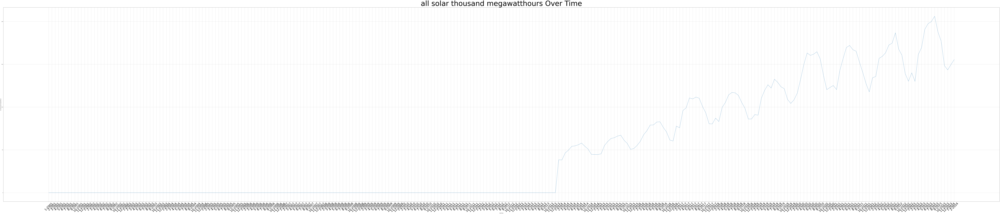

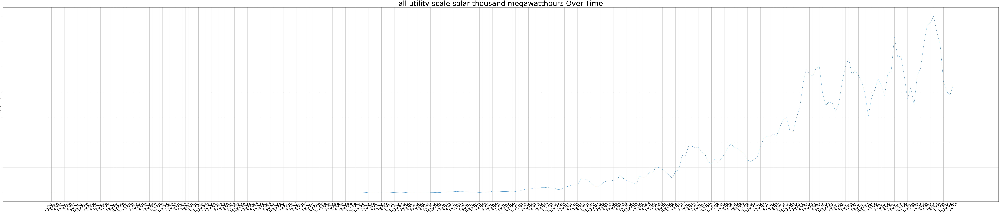

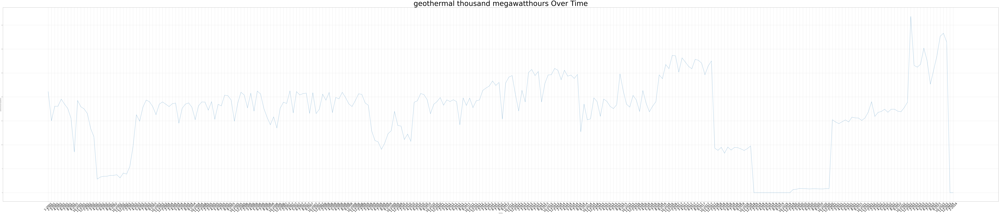

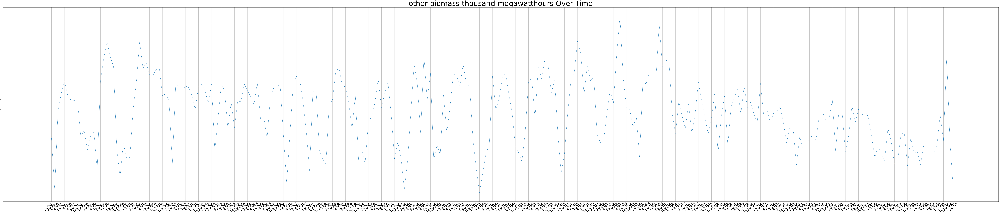

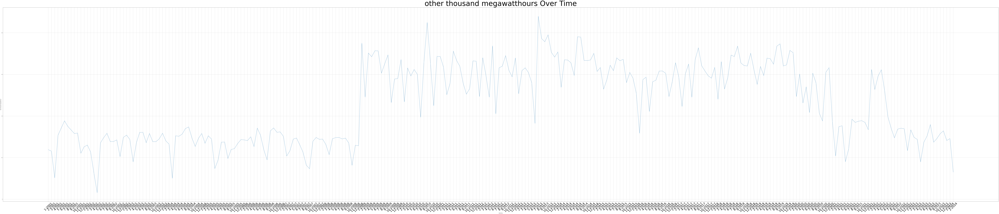

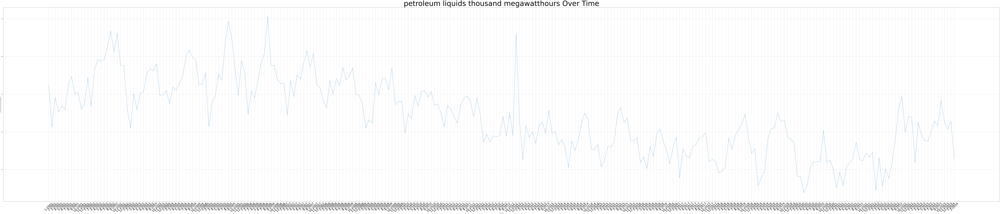

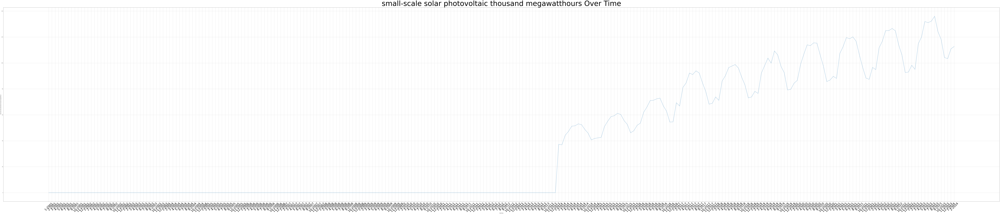

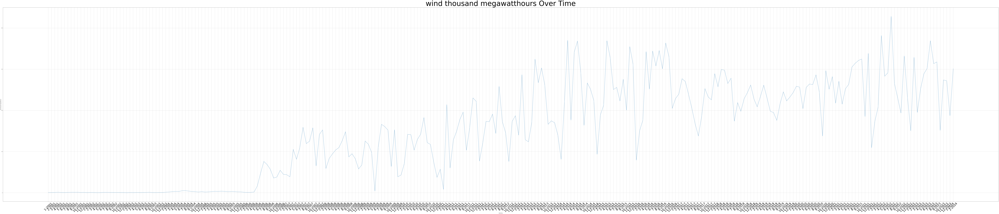

In [4]:
import matplotlib.pyplot as plt

# Extract 'Month', 'Year', and 'all fuels (utility-scale) thousand megawatthours' columns
month_year = df['Month'].astype(str) + '-' + df['Year'].astype(str)

# Reverse the order of month_year
month_year = month_year[::-1]

# Exclude 'Month' and 'Year' columns
columns_to_plot = df.columns.difference(['Month', 'Year'])

# Plot each column separately
for column_name in columns_to_plot:
    # Extract column data
    column_data = df[column_name]
    
    # Reverse the order of column_data to match month_year
    column_data = column_data[::-1]
    
    # Plot
    plt.figure(figsize=(250, 50))
    plt.plot(month_year[:1000], column_data[:1000])
    plt.xlabel('Month-Year')
    plt.ylabel(f'{column_name}')
    plt.title(f'{column_name} Over Time', fontsize=100)
    plt.xticks(rotation=45, fontsize = 40)  # Rotate x-axis labels for better readability
    plt.grid(True)
    plt.show()


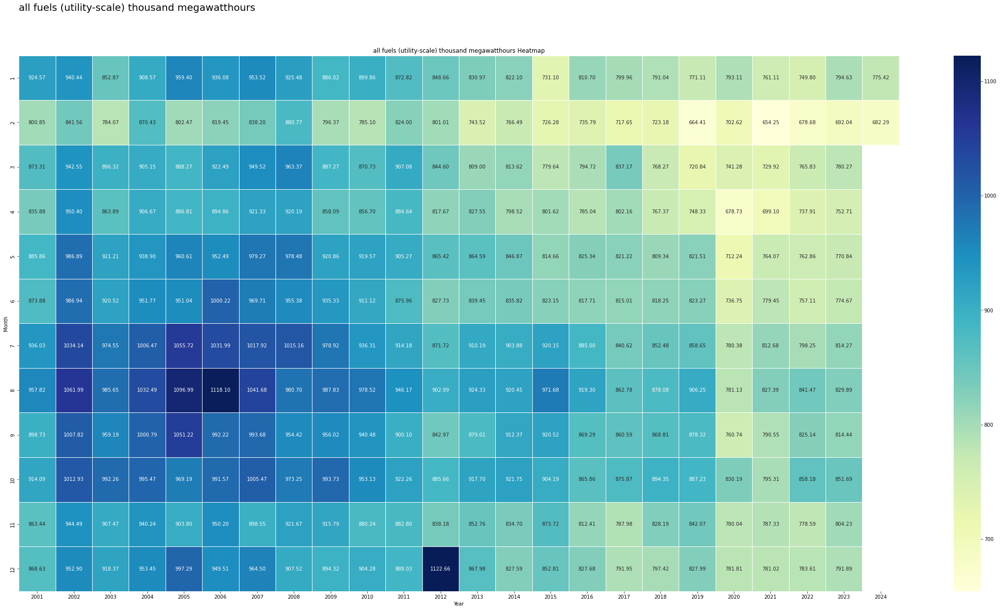

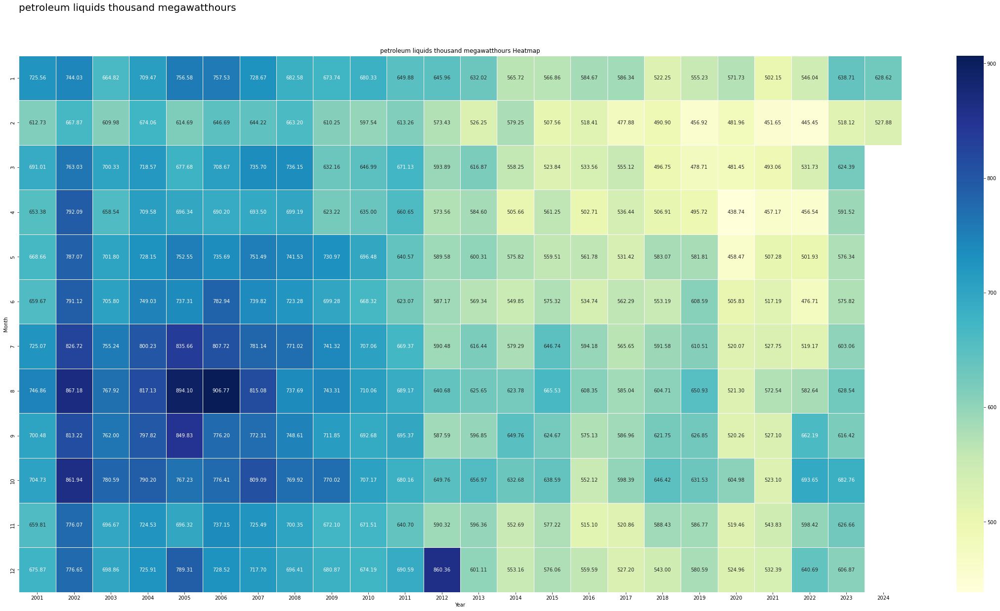

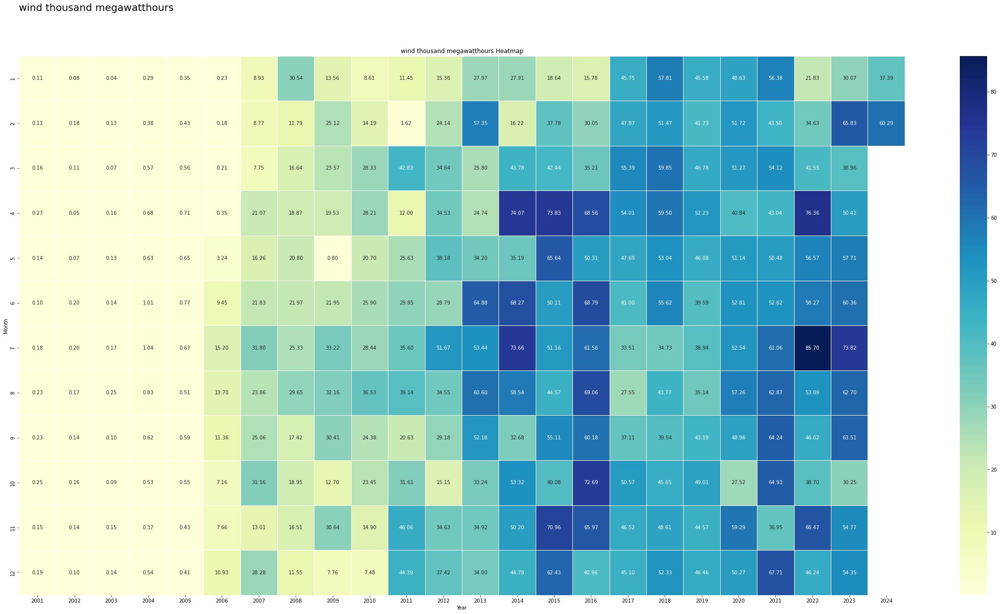

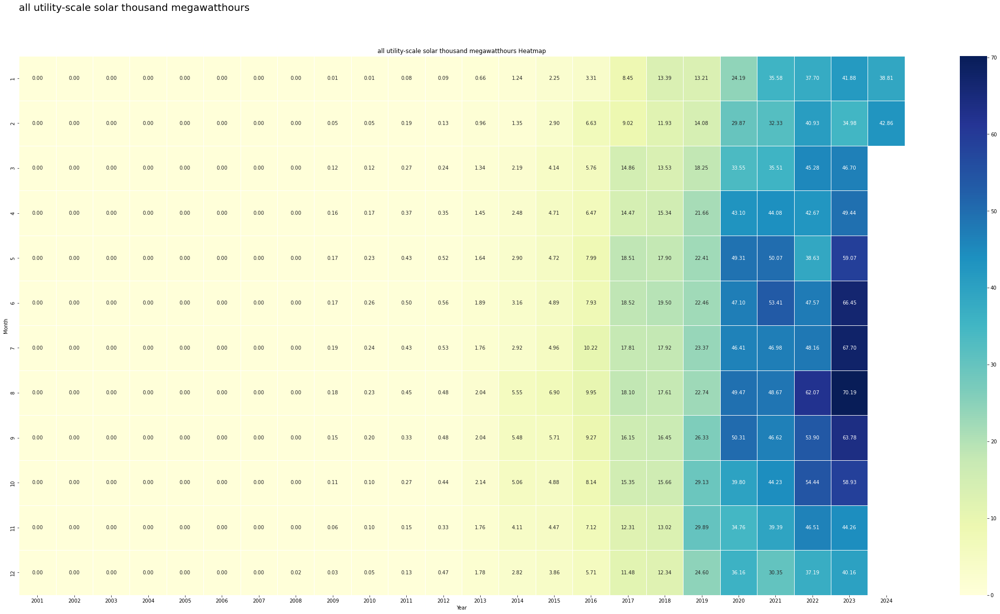

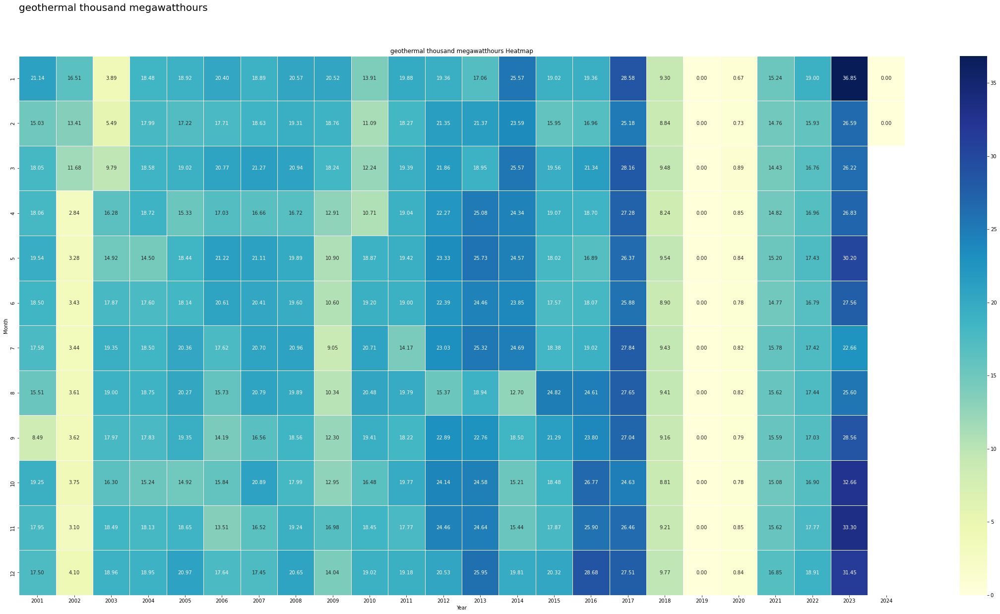

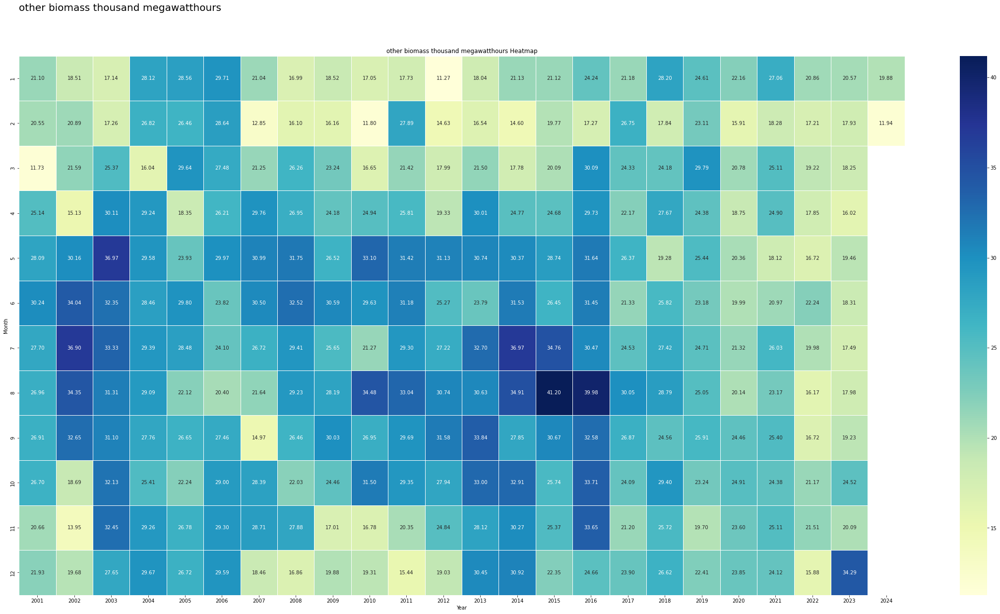

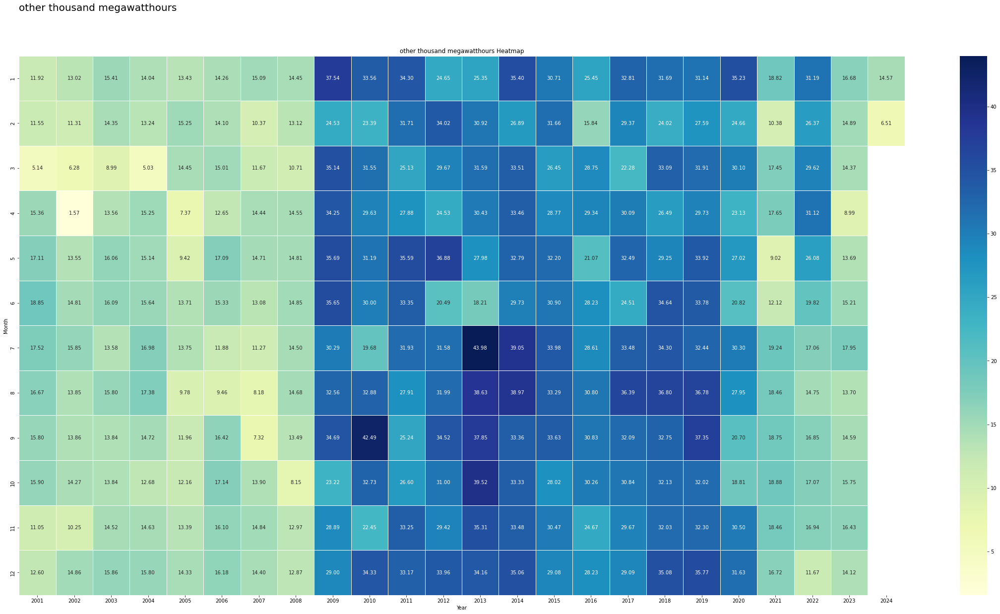

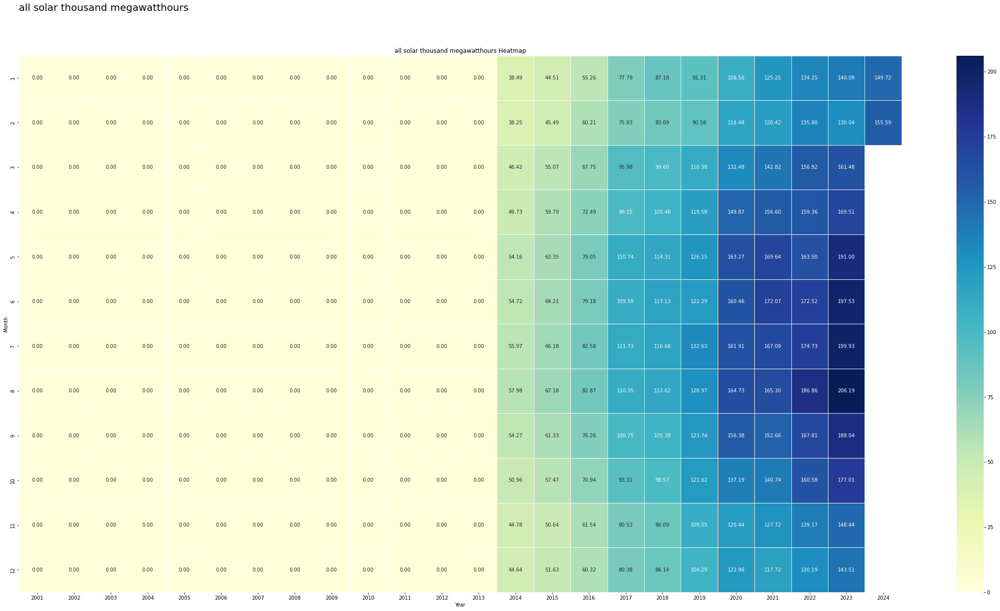

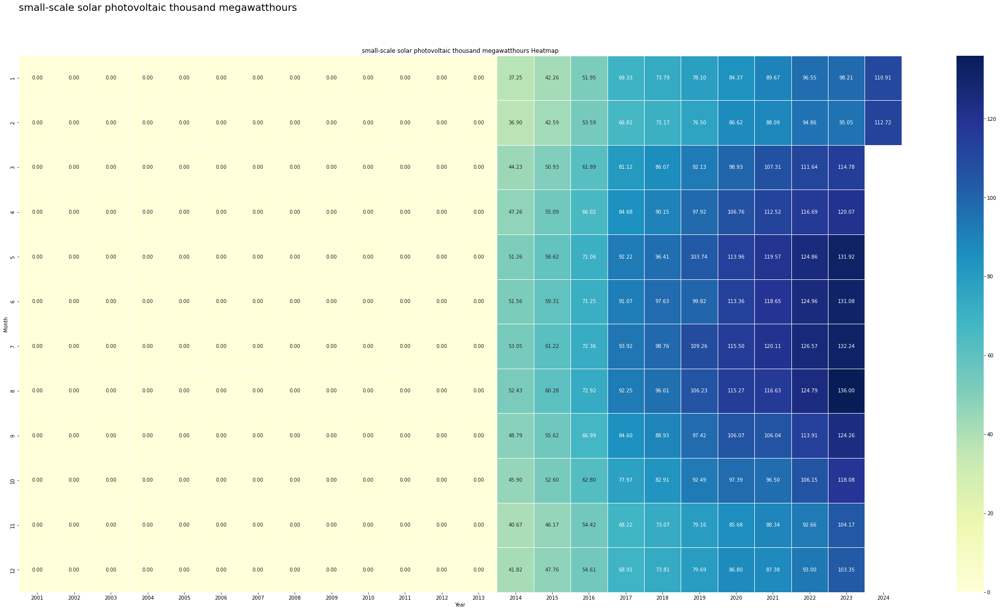

In [5]:
import seaborn as sns

# Lista de columnas de interés para crear heatmaps
columns_of_interest = ['all fuels (utility-scale) thousand megawatthours', 'petroleum liquids thousand megawatthours', 'wind thousand megawatthours', 'all utility-scale solar thousand megawatthours', 'geothermal thousand megawatthours', 'other biomass thousand megawatthours', 'other thousand megawatthours', 'all solar thousand megawatthours', 'small-scale solar photovoltaic thousand megawatthours']

# Iterar sobre cada columna de interés
for column_name in columns_of_interest:
    # Pivotear el DataFrame para tener 'Month' como filas, 'Year' como columnas, y la columna de interés como valores
    pivot_df = df.pivot('Month', 'Year', column_name)
    
    # Crear el heatmap
    plt.figure(figsize=(40, 20))
    sns.heatmap(pivot_df, cmap='YlGnBu', annot=True, fmt=".2f", linewidths=.5)
    plt.title(f'{column_name} Heatmap')
    plt.xlabel('Year')
    plt.ylabel('Month')
    plt.text(0, -1, column_name, ha='left', fontsize=20)  # Add column name as text
    plt.show()

## Grafica Modelo vs Data set

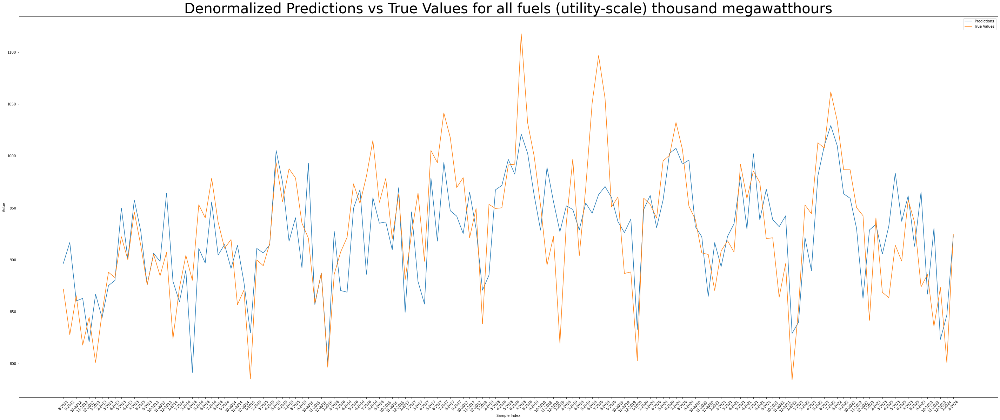

In [10]:
# Realizar predicciones
predictions = []
for i in range(len(X_test)):
    x_test_i = X_test[i].reshape(-1, 1)
    predicted_test = rnn.forward(x_test_i)
    predictions.append(predicted_test[0][0])  # Extraer el valor real de la matriz 2D

# Iterar sobre cada columna utilizada en el conjunto de datos original
for column_name in ['all fuels (utility-scale) thousand megawatthours']:
    # Seleccionar la columna y convertirla a un arreglo NumPy
    column_data = df[column_name].values
    
    # Calcular la media y la desviación estándar de la columna
    mean_column = column_data.mean()
    std_column = column_data.std()
    
    # Denormalizar y_test
    y_test_denorm = y_test * std_column + mean_column
    
    # Denormalizar las predicciones
    predictions_denorm = np.array(predictions) * std_column + mean_column
    
    # Obtener los valores de 'Month' y 'Year' asociados al índice de prueba
    sample_index = df.index[:train_size]
    months = df.loc[sample_index, 'Month']
    years = df.loc[sample_index, 'Year']
    
    # Visualizar las predicciones junto con los valores reales
    plt.figure(figsize=(50, 20))
    plt.plot(sample_index[::-1], predictions_denorm[::-1], label='Predictions')  # Invertir el orden de los índices
    plt.plot(sample_index[::-1], y_test_denorm[::-1], label='True Values')  # Invertir el orden de los índices
    plt.xlabel('Sample Index')
    plt.ylabel('Value')
    plt.title(f'Denormalized Predictions vs True Values for {column_name}', fontsize=40)
    plt.legend()
    
    # Crear etiquetas para el eje x combinando el mes y el año
    x_labels = [f"{month}-{year}" for month, year in zip(months[::-1], years[::-1])]  # Invertir el orden de los meses y años
    plt.xticks(ticks=sample_index, labels=x_labels, rotation=45)
    
    plt.show()


In [7]:
# Define a function for making future predictions
def predict_future(model, initial_input, num_steps):
    predicted_values = []
    current_input = initial_input
    
    for _ in range(num_steps):
        # Make a prediction for the current input
        predicted_output = model.forward(current_input.reshape(-1, 1))
        
        # Append the predicted value to the list of predicted values
        predicted_values.append(predicted_output[0][0])
        
        # Update the current input to include the predicted value
        current_input = np.append(current_input[1:], predicted_output)
    
    return np.array(predicted_values)

# Train the model (as before)
# Define and train the model (as before)
learning_rate = 0.001
num_epochs = 100

rnn = SimpleRNN(input_size=X.shape[1], hidden_size=64, output_size=1)

for epoch in range(num_epochs):
    for i in range(len(X_train)):
        x_i = X_train[i].reshape(-1, 1)
        y_i = y_train[i].reshape(-1, 1)

        # Forward pass
        predicted = rnn.forward(x_i)

        # Compute loss and update weights
        loss = np.square(predicted - y_i).sum()
        dloss = 2.0 * (predicted - y_i)
        dh = np.dot(rnn.Why.T, dloss)
        drnn = (1 - rnn.h * rnn.h) * dh
        rnn.Why -= learning_rate * np.dot(dloss, rnn.h.T)
        rnn.Wxh -= learning_rate * np.dot(drnn, x_i.T)
        rnn.Whh -= learning_rate * np.dot(drnn, rnn.h.T)

# After training, make predictions for the next 3 months
# Use the last available data point as initial input for prediction
initial_input = X_test[-1]

# Predict the next 6 months
num_steps = 6
future_predictions = predict_future(rnn, initial_input, num_steps)

# Denormalize the predictions
mean_consumption = df['all fuels (utility-scale) thousand megawatthours'].mean()
std_consumption = df['all fuels (utility-scale) thousand megawatthours'].std()
future_predictions_denorm = future_predictions * std_consumption + mean_consumption

# Create a DataFrame for the future predictions
future_dates = ['2024-03', '2024-04', '2024-05', '2024-06', '2024-07', '2024-08']  
future_df = pd.DataFrame({'Month': future_dates, 'Predicted Consumption': future_predictions_denorm})

# Display the DataFrame with future predictions
future_df.head(6)

,Month,Predicted Consumption
0,2024-03,898.250473
1,2024-04,893.685087
2,2024-05,821.729827
3,2024-06,839.482774
4,2024-07,851.803211
5,2024-08,829.216231


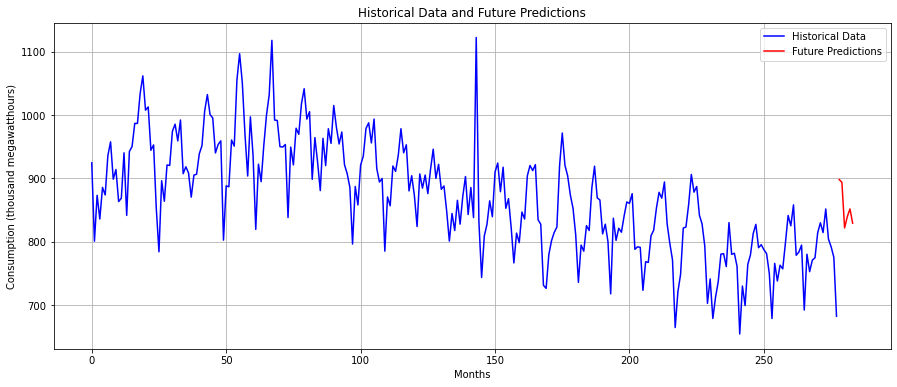

In [8]:
# Crear un DataFrame para los datos históricos organizados en orden inverso
historical_data_reverse = df.iloc[::-1].reset_index(drop=True)

# Graficar los datos históricos
plt.figure(figsize=(15, 6))
plt.plot(historical_data_reverse.index, historical_data_reverse['all fuels (utility-scale) thousand megawatthours'], label='Historical Data', color='blue')

# Graficar las predicciones futuras
num_historical_months = len(historical_data_reverse)
plt.plot(range(num_historical_months, num_historical_months + len(future_df)), future_df['Predicted Consumption'], label='Future Predictions', color='red')

# Etiquetas y título del gráfico
plt.xlabel('Months')
plt.ylabel('Consumption (thousand megawatthours)')
plt.title('Historical Data and Future Predictions')

# Agregar una leyenda
plt.legend()

# Mostrar la gráfica
plt.grid(True)
plt.show()